Digitisation 2D Sections From Scan Images
====================================



![](https://i.imgur.com/K8ofvyr.png)


Aims
====

Generally, we digitise legacy data in geosciences, such as interpreted geological or seismic sections. Digitisation is creating a computerised representation of a printed analogue. Therefore, it refers to converting surface or subsurface geological sections that were originally interpreted in another format. There are many methods of digitising and various media to be digitised using commercial software, for instance, **MOVE Suite - Petroleum Experts**  (https://www.petex.com/products/move-suite/). However, manual digitisation is time-consuming, tedious and repetitive.

The main focus rests primarily on digitising horizons and faults from images, as these are the main objective in our digitisation process. For this reason, we build this digitisation tool to automate the process. Technically, the process of digitisation involves converting an analogue image into its corresponding numeric values. In this context, we build a digitisation tool and apply it to all Ruhr Coalmine datasets.

https://www.researchgate.net/publication/40910531_An_Overview_of_Digitization_of_Information_Resources

This notebook looks into creating a 2.5D sectional mesh from typical coalmines data. This is a common task to create a 2.5D image/sectional mesh of data such as geological interpreted coalmines profiles. Moreover, we drape a 2D section from a line in 3D space. For this example, we have a traverse line or path on the ground surface and a 2D section of the collected image under that line. With these data, we have a 2D image/array of data values and 3D coordinates of where that line/profile is in 3D space (where we collected the data on the surface of topography).

Ruhr Coalmines DataSet
=====================
**Area-1 Summary**

The study area is explored by high-resolution, closely spaced, coal mines with an aerial extent of 323.29 km2 and a depth of 2 km. The subsurface data are provided by mine-workings (galleries, adits and shafts) as well as accompanying boreholes and seismic reflection profiles, which are supported by surface exposure enhanced by open-cast pits. These data were interpreted by Drozdzewski et al. (1980), who reported these observations and erected their own geological interpretations on a series of paper maps and cross-sections. 

They are a set of 12 serial cross-sections with a spacing of 1 to 2 km and tied by two cross-lines. Further, Drozdzewski et al. (1980) indicate the levels of confidence in their interpretations critically using descriptive criteria. The stratigraphic column present in this study is put together and generated after Drozdzewski et al. (1980), Drozdzewski (1993), Suess et al. (2007), Cleal et al. (2009) and Uhl and Cleal (2010). The lithology, formations names, coal seams and stratigraphic units in this stratigraphic column are constrained by correlating the stratigraphic units from Drozdzewski et al. (1980) to other recent studies (e.g. Cleal et al. 2009; Uhl and Cleal 2010). 


## Import Libraries

In [1]:
import cv2
import os
import glob
import pathlib
%matplotlib inline
import numpy as np
import pandas as pd
import open3d as o3d
from tqdm import tqdm
import matplotlib.pyplot as plt
from copy import deepcopy as copy
from scipy.spatial import Delaunay
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

plt.style.use('seaborn-white')
import scipy.interpolate as interp
import pyvista as pv
from pyvista import examples
from pyvista import set_plot_theme
set_plot_theme('document')

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## Workflow Examples Section-1 and 3

### Section-1

Reading the image file and performing image processing techniques. First, make the image grey, get the edge and then digitise the image.

In [2]:
img=cv2.imread(r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1\Tafel_24_Section_1_Emscher_West_Ruhrgebit_G1.png')

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 75, 150, apertureSize = 3)
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50)

laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

Getting the digitise horizons from the image by getting the x and y values.

In [3]:
img2=img

if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            if abs(y2-y1)==0 and abs(x2-x1)>2:
                cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
img2 = img
test_1 = cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)

Splitting the x and z values for each horizons in the section.

In [4]:
x = []
for i in range(len(lines)):
    for j in (0, 2):
        x.append(lines[i][0][j])
z = []
for i in range(len(lines)):
    for j in (1, 3):
        z.append(lines[i][0][j])

After getting the data, we apply the scale factor to the x, y and z directions and then store the data in a data frame to make it organised.

In [5]:
# Scale the data in the x direction
scale_factor_x = 2
# Scale the data in the z direction and correct for the depth
scale_factor_z = -7
depth_correction = 400
# Creating the y data using the x data since the section digitised in two direction (x, z)

d = {'x' : x, 'z' : z}
xyz_int_df = pd.DataFrame(d)
xyz_int_df['x'] = xyz_int_df['x'] * scale_factor_x
xyz_int_df['z'] = (xyz_int_df['z'] * scale_factor_z) + depth_correction
xyz_int_df['y'] = (xyz_int_df['x']) / scale_factor_x*2

Plotting the raw image with the interpreted horizons

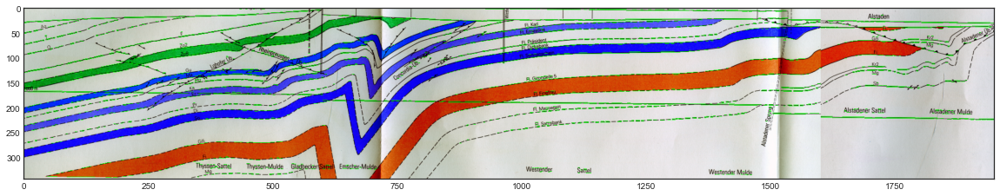

In [6]:
plt.figure(figsize=(20,20))
plt.imshow(img);

Plotting the image on grey scale.

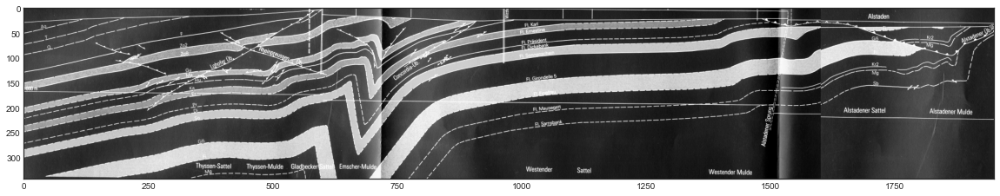

In [7]:
plt.figure(figsize=(20,20))
plt.imshow(gray);

Appling edge detection filter to the image then use it for digitisation the horizons

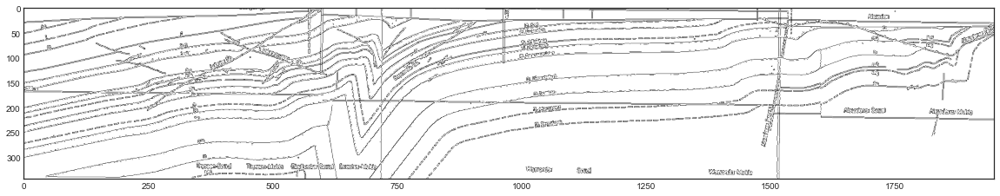

In [8]:
plt.figure(figsize=(20,20))
plt.imshow(edges);

Later we use the OpenCV function Laplacian() to implement a discrete analog of the Laplacian operator. For more info check https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


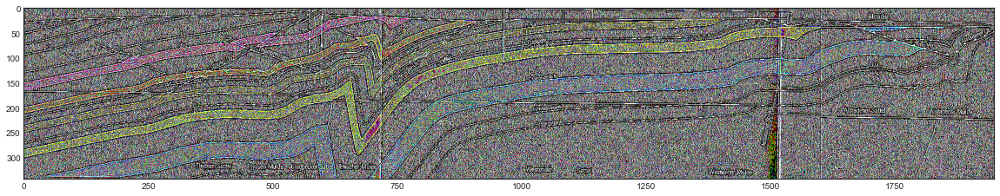

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(laplacian);

Moreover we applied sobel filter in the x direction.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


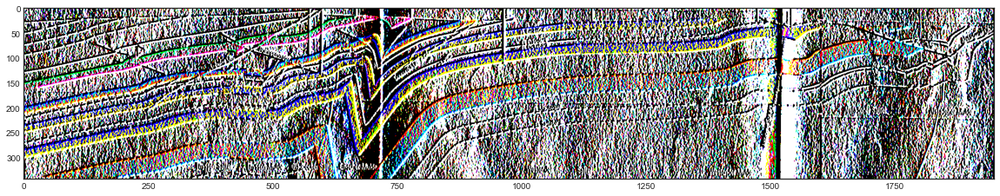

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(sobelx);

Moreover we applied sobel filterin the y direction.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


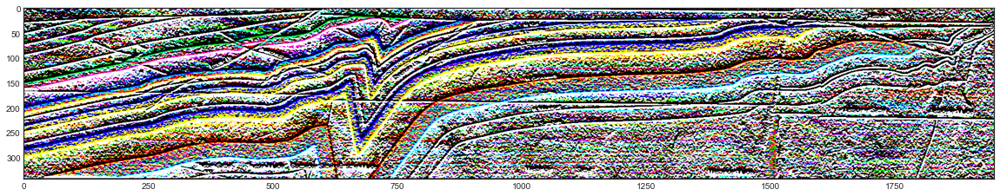

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(sobely);

Finally, we plot the raw image with the digitise horizons, faults and wells.

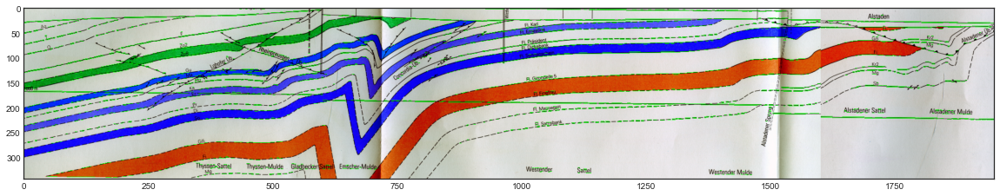

In [12]:
plt.figure(figsize=(20, 20))
plt.imshow(test_1);

Plot the final digitisation result. Notice the horizons, faults and vertical boreholes and horizontal wells.

In [13]:
chart_title ="Digitised Geological Section No.1" + "\nGenerated from Coalmines Geological Interpretation" + "\nCoalmines Dataset from Ruhr Sub Basin, Lower Rhine Basin, Germany" 

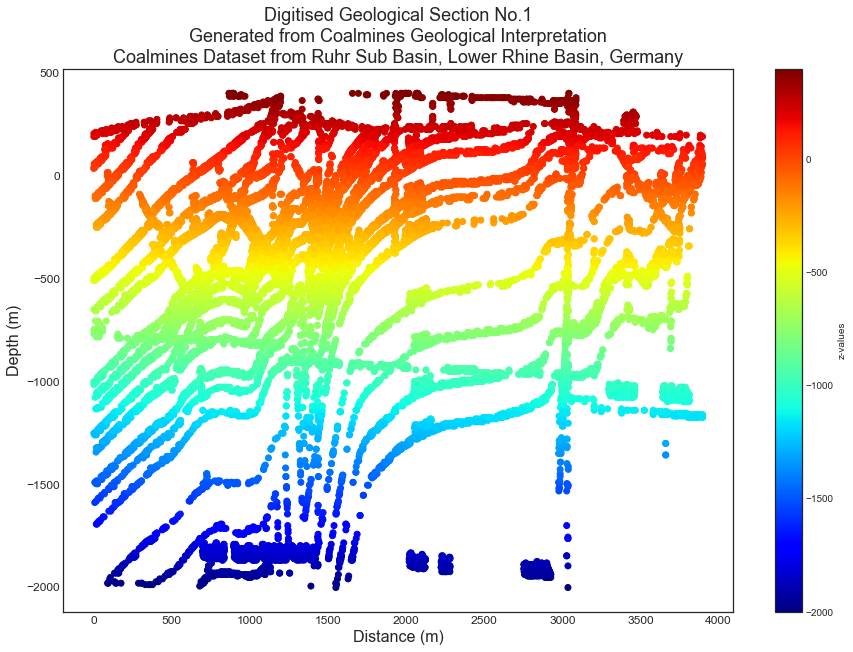

In [14]:
# Headline title
text = chart_title
# Decorations
plt.title(chart_title, fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

im = plt.scatter(xyz_int_df['x'], xyz_int_df['z'], c=xyz_int_df['z'],cmap="jet")
plt.colorbar(im, label="z-values")
plt.xlabel("x")
plt.ylabel("z");


fig_size = plt.gcf().get_size_inches() #Get current size
sizefactor = 2.5 #Set a zoom factor
# Modify the current size by the factor
plt.gcf().set_size_inches(sizefactor * fig_size) 
plt.xlabel('Distance (m)', fontsize=16)
plt.ylabel('Depth (m)', fontsize=16);

Lastly, we plot the constructed raw image with the digitised results.

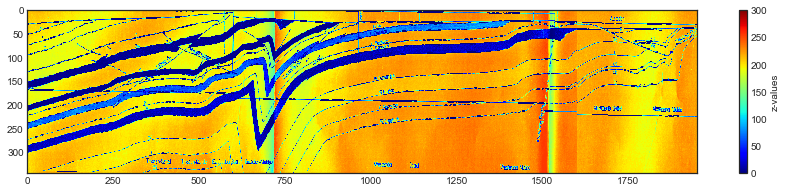

In [15]:
plt.figure(figsize=(15, 3))
plt.pcolormesh(test_1[:,:,0], cmap="jet", clim=[0,300]) # , clim=[-1, 1]
plt.gca().invert_yaxis()
plt.colorbar(label="z-values");

## Drape 2D Surface From our geological sections

Drape a surface (2D array) from a geolgocial section in 3D space. This is a common task to create a 2.5D image/sectional mesh of geological data or geophysics applications. Here we utlise pyvista to provides a look into how to create a 2.5D sectional mesh from typical data in those use cases.

For this example, we have an section path on the ground surface trajectory (the line) and a 2D array of the collected image under that line.

https://docs.pyvista.org/

We read the data, store it in a dataframe and then select one geological path on the surface.

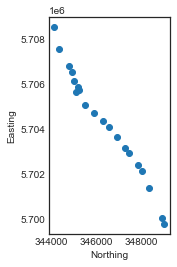

In [16]:
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1\Study-Area-1.dat"
df = pd.read_table(file_path, sep="\s+")

path = df[df['Name'] == "Tafel_24_Section_1_Emscher_West_Ruhrgebit_G1"][['z', 'x', 'y']].values
data = test_1[:,:,0].copy()

######### Plot the data########
plt.scatter(path[:, 1], path[:, 2])
plt.axis("image")
plt.xlabel("Northing")
plt.ylabel("Easting");

We need to interpolate between the path points to get the same data pints as the data inorder to plot it.

In [17]:
arr_x = path[:,1:2]
arr_x_interp = interp.interp1d(np.arange(arr_x.size),arr_x.reshape(arr_x.shape[0]))
arr_x_stretch = arr_x_interp(np.linspace(0,arr_x.size-1,data.shape[0]))

arr_y = path[:,2:3]
arr_y_interp = interp.interp1d(np.arange(arr_y.size),arr_y.reshape(arr_y.shape[0]))
arr_y_stretch = arr_y_interp(np.linspace(0,arr_y.size-1,data.shape[0]))

Creating and plotting the path data with the same data points.

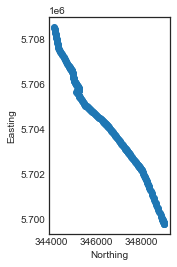

In [18]:
path = pd.DataFrame({'x' : arr_x_stretch,
                     'y' : arr_y_stretch,
                     'z' : arr_x_stretch*0-1000
                    }).values

########## Plot the Data #######################
plt.scatter(path[:,0], path[:, 1])
plt.axis("image")
plt.xlabel("Northing")
plt.ylabel("Easting");

We apply a check to make sure the coordinates of the path are present in the data and available for every trace.

In [19]:
assert len(path) in data.shape, "Make sure coordinates are present for every trace."
# If not, you'll need to interpolate the path!

Now we are good to apply the match the data with the surface path or trajectory.

In [20]:
# Grab the number of samples (in Z dir) and number of traces/soundings
ntraces, nsamples = data.shape  # Might be opposite for your data, pay attention here

# Define the Z spacing of your 2D section
z_spacing = 0.12

# Create structured points draping down from the path
points = np.repeat(path, nsamples, axis=0)
# repeat the Z locations across
tp = np.arange(0, z_spacing * nsamples, z_spacing)
tp = path[:, 2][:, None] - tp
points[:, -1] = tp.ravel()

In [21]:
points.shape

(670800, 3)

In [22]:
path

array([[ 3.44107400e+05,  5.70856681e+06, -1.00000000e+03],
       [ 3.44118738e+05,  5.70851220e+06, -1.00000000e+03],
       [ 3.44130075e+05,  5.70845758e+06, -1.00000000e+03],
       ...,
       [ 3.49011340e+05,  5.69978560e+06, -1.00000000e+03],
       [ 3.49017600e+05,  5.69977052e+06, -1.00000000e+03],
       [ 3.49023860e+05,  5.69975544e+06, -1.00000000e+03]])

### Surface Trajectory and Interpreted Geological Cross Sections

We used pyvista to model the digitised data and create a 2.5D subsurface model.

In [23]:
model_path = pv.StructuredGrid()
model_path.points = points
model_path.dimensions = nsamples, ntraces, 1

# Add the data array - note the ordering!
model_path["values"] = data.ravel(order="F")

In [24]:
path_p = pv.Plotter()
path_p.add_mesh(model_path, cmap="gray")
path_p.add_mesh(pv.PolyData(path), color='orange')
path_p.show_axes()
# _ = path.show_grid()
path_p.show() # cpos=cpos

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

 # Ruhr Coalmines DataSet

# 1. Results - Emscher West Ruhrgebit Map - Area-1

![](https://i.imgur.com/qF7SCDK.png)

Here we put together two helper functions to apply the above-created workflow and apply it to the data set.

In [25]:
def digitise_section(img):
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 75, 150, apertureSize = 3)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50)
    
    img2=img
    if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                if abs(y2-y1)==0 and abs(x2-x1)>2:
                    cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
    img2 = img
    test_1 = cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
    
    x = []
    for i in range(len(lines)):
        for j in (0, 2):
            x.append(lines[i][0][j])
    z = []
    for i in range(len(lines)):
        for j in (1, 3):
            z.append(lines[i][0][j])
    
    d = {'x' : x, 'z' : z}
    xyz_int_df = pd.DataFrame(d)
    xyz_int_df['x'] = xyz_int_df['x'] * 2
    xyz_int_df['z'] = (xyz_int_df['z'] * -7) + 400
    xyz_int_df['y'] = (xyz_int_df['x']) / -4
    
    return xyz_int_df

In [26]:
def digitise_data_section(img):
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 75, 150, apertureSize = 3)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50)
    
    img2=img
    if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                if abs(y2-y1)==0 and abs(x2-x1)>2:
                    cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
    img2 = img
    test_1 = cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
    
    x = []
    for i in range(len(lines)):
        for j in (0, 2):
            x.append(lines[i][0][j])
    z = []
    for i in range(len(lines)):
        for j in (1, 3):
            z.append(lines[i][0][j])
    
    d = {'x' : x, 'z' : z}
    xyz_int_df = pd.DataFrame(d)
    xyz_int_df['x'] = xyz_int_df['x'] * 2
    xyz_int_df['z'] = (xyz_int_df['z'] * -7) + 400
    xyz_int_df['y'] = (xyz_int_df['x']) / -4
    
    return test_1[:,:,0]

In [27]:
def stretch_arr(arr_input, arr_ref):
    """
    The input array should be 1D as x or y
    """
    arr_x_interp = interp.interp1d(np.arange(arr_input.size),arr_input.reshape(arr_input.shape[0]))
    arr_x_stretch = arr_x_interp(np.linspace(0,arr_input.size-1,arr_ref.shape[0]))
    return arr_x_stretch

In [28]:
def digitise_section_clear(img):
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 75, 150, apertureSize = 3)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50)
    
    img2=img
    if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                if abs(y2-y1)==0 and abs(x2-x1)>2:
                    cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
    img2 = img
    test_1 = cv2.line(img2, (x1, y1), (x2, y2), (0, 255, 0), 1)
    
    x = []
    for i in range(len(lines)):
        for j in (0, 2):
            x.append(lines[i][0][j])
    z = []
    for i in range(len(lines)):
        for j in (1, 3):
            z.append(lines[i][0][j])
    
    d = {'x' : x, 'z' : z}
    xyz_int_df = pd.DataFrame(d)
    xyz_int_df['x'] = xyz_int_df['x']
    xyz_int_df['z'] = (xyz_int_df['z'] ) 
    xyz_int_df['y'] = (xyz_int_df['x']) / -4
    
    return xyz_int_df

First, we open the images' folder and store the images' names and data in one dictionary.

In [29]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[9:20])
        img_data[a[9:20]] = digitise_section(cv2.imread(image))
        sec_data[a[9:20]] = digitise_data_section(cv2.imread(image))

Now let us create a helper function to digitise all our sections and save the results with the input sections.

In [30]:
def plot_input_output(folder_dir):
    directory = "Digitised_images"
    dir = Path(folder_dir)
    path = os.path.join(dir, directory)
    try:
        os.mkdir(path)
        print("Directory '%s' created successfully" % directory)
    except OSError as error:
        print("Directory '%s' can not be created" % directory)
    dir = Path(folder_dir + '/' + directory)

    for image in glob.iglob(f'{folder_dir}/*'):
        if (image.endswith(".png")):
            a = image.split("\\")[-1]
            a = a.split(".")[0]
            plt.style.use('seaborn-whitegrid')
            plt.rcParams.update({'font.size': 12})
            fig, (ax1, ax2) = plt.subplots(2, 1, sharey=True, sharex=True, figsize=(12, 8))
            fig.subplots_adjust(left=0.1, right=0.9, top=0.92, bottom = 0.08, wspace=0.4)

            ax1.imshow(cv2.imread(image))

            ax2.scatter(digitise_section_clear(cv2.imread(image))['x'], 
                             digitise_section_clear(cv2.imread(image))['z'], 
                             c=digitise_section_clear(cv2.imread(image))['z'],
                        linewidths=1,
                             s= 1,
                             cmap="jet")

            chart_title_input = a[8:20] + "\n" + " Emscher West Ruhrgebit Area" + "\nCoalmines Dataset from Ruhr Sub Basin, Lower Rhine Basin, Germany" 
            chart_title_output ="Digitised Geological " + a[8:20] + "\nGenerated from Coalmines Geological Interpretation" + "\nCoalmines Dataset from Ruhr Sub Basin, Lower Rhine Basin, Germany" 
            plt.title(chart_title_output, fontsize=16, pad=10) 
            plt.suptitle(chart_title_input, size=16, y=0.93) 
            plt.tight_layout()
            fn = dir / "digitise_{}.png".format(a[8:22])
            plt.savefig(fn)
            plt.close()   

Let us save  all our images with the digitise sections.

In [31]:
folder_dir_area_1 = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1'
plot_input_output(folder_dir_area_1)

<IPython.core.display.Javascript object>

Directory 'Digitised_images' can not be created


<IPython.core.display.Javascript object>

Second, we open the path data after geo-referencing the images using AutoCAD; however, this can be done by any geo-referenced software.

https://www.autodesk.co.uk/products/autocad/trial-intake

Or we can use ArcGIS to do the geo-reference.

https://pro.arcgis.com/en/pro-app/latest/help/data/imagery/overview-of-georeferencing.htm

In [32]:
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1\study-paths-area-1-Ls.dat"

df = pd.read_table(file_path, sep="\s+")
# path_name_ls = df['Name'].unique().tolist()

In [33]:
dict_map = {
 
'Section_1__152' : 'Section_1_E',
 'Section_2__153' : 'Section_2_E',
 'Section_3__154' : 'Section_3_E',
 'Section_4__155' : 'Section_4_E',
 'Section_5__156' : 'Section_5_E',
 'Section_6__163' : 'Section_6_E',
 'Section_7__163' : 'Section_7_E',
 'Section_8__158' : 'Section_8_E',
 'Section_9__159' : 'Section_9_E', 
'Section_10_160' : 'Section_10_',
 'Section_11_161': 'Section_11_',
 'Section_12_162' : 'Section_12_'
                }

In [34]:
df['Name'] = df['Name'].map(dict_map)

In [35]:
path_name_ls = df['Name'].unique().tolist()
path_data = {}
for path_nam in sections_names:
    path_data[path_nam] = df[df['Name'] == path_nam][['z', 'x', 'y']]

We apply the georeference to the data and concatenate all the data together in one list.

In [36]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names:
    img_data[section]['x'] = img_data[section]['x'].values  + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values  + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

Plot the results of all sections 

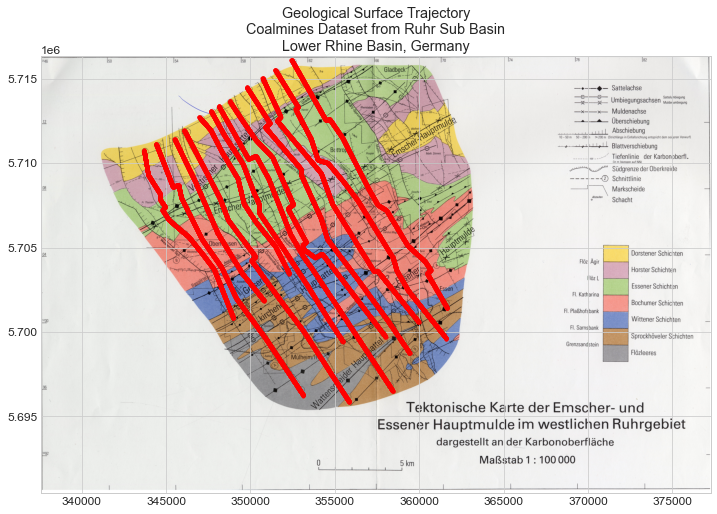

In [37]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1\Tafel_23_Map_DeepTectoniic_Emscher_West_Ruhr_09112018.tif")
file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-1\study-BBox-area-1-Ls.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))

for section in sections_names:
    ax.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values, 
               zorder=1, alpha= 0.8, c='red', s=10, label=section)
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal');

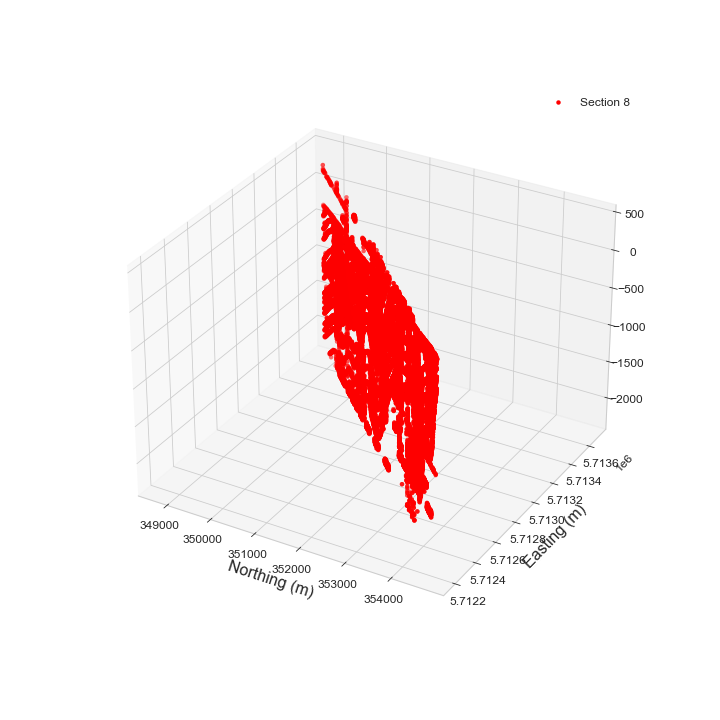

In [38]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

ax.scatter(img_data['Section_8_E']['x'].values, 
               img_data['Section_8_E']['y'].values,
               img_data['Section_8_E']['z'].values, 
               lw=0.0001, label='Section 8', color='red')

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

C:\Users\r04ra18\Anaconda3\envs\ML_comp\lib\site-packages\ipympl\backend_nbagg.py:336: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self.figure.savefig(buf, format='png', dpi='figure')


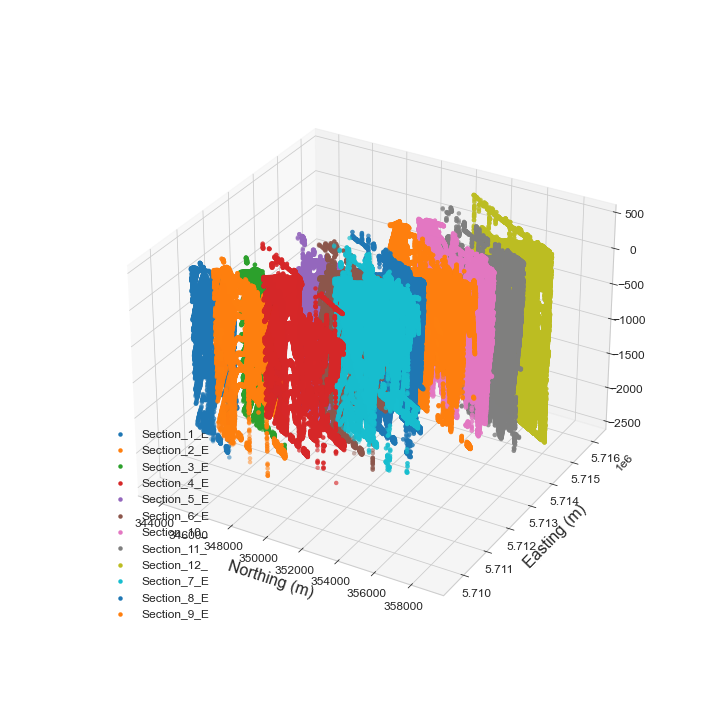

In [39]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names[:]:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.0001, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

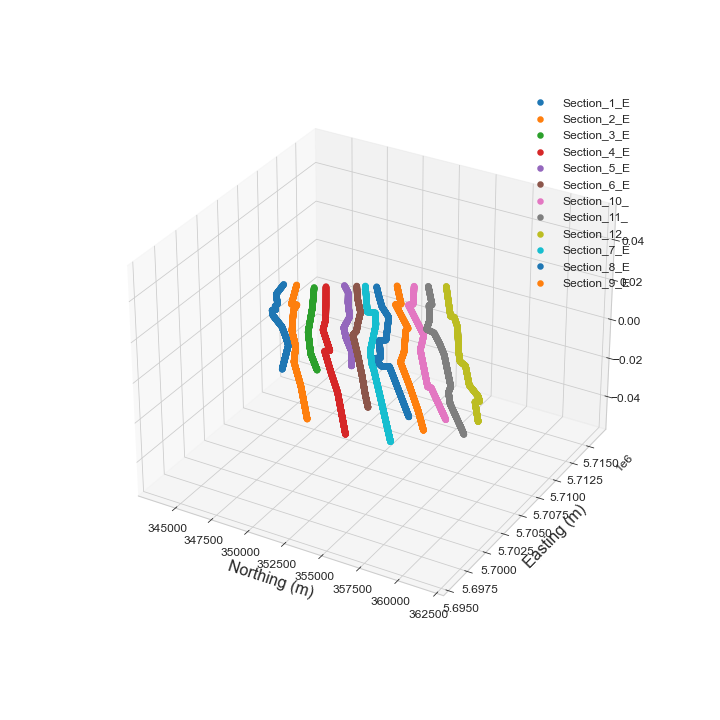

In [40]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax1 = plt.axes(projection='3d')

for section in sections_names:
    ax1.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values,
               path_data[section]['z'].values, 
               lw=2, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax1.legend();
# ax.view_init(60,60)

## Modelling using Pyvista

We used Pyvista to plot the surface trajectory of the sections.

In [41]:
all_paths_points = pv.PolyData(all_paths[['y','x','z']].astype(float).values)
all_paths_points["Depth (m)"] = all_paths['z'].values

In [42]:
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

In [43]:
p_paths = pv.Plotter()
p_paths.add_mesh(all_paths_points, point_size=5, render_points_as_spheres=True)
actor = p_paths.add_title(title_paths, font='arial', color='k',
                     font_size=10)
p_paths.show_axes()
# _ = p_paths.show_grid()
p_paths.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Geological Coalmines Sections

We plotted the 12 digitised geological sections.

In [44]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

In [45]:
title_sections = "Digitised Geological Sections of Study Area-1" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

In [46]:
p_sections = pv.Plotter()
p_sections.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections.show_axes()
# _ = p_sections.show_grid()
p_sections.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [47]:
section_8_points = pv.PolyData(img_data['Section_8_E'][['y','x','z']].astype(float).values)
section_8_points["Depth (m)"] = img_data['Section_8_E']['z'].values

In [48]:
title_section = "Digitised Geological Section-8 of Study Area-1" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

In [49]:
p_section_8 = pv.Plotter()
p_section_8.add_mesh(section_8_points, point_size=3, render_points_as_spheres=True)
actor = p_section_8.add_title(title_section, font='arial', color='k',
                     font_size=10)
p_section_8.show_axes()
# _ = p_section_8.show_grid()
p_section_8.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Creating a 3D Uniform Model from the Digitised Sections 

3D Geological modelling by plotting the 12 interpreted cross sections.

In [50]:
# grid = pv.UniformGrid()
# # grid.origin = (all_paths['y'].max()-4000, all_paths['x'].max()-7000, -1500)
# grid.origin = (path_data['Section_12_']['y'].max()-7000, path_data['Section_12_']['x'].min()-9000, -3500)
# grid.spacing = (20, 20, 10)
# grid.dimensions = (400, 800, 400)

In [51]:
# interpolated = grid.interpolate(all_sections_points, radius=5000, sharpness=10, strategy='mask_points')

In [52]:
# p_model = pv.Plotter()
# # probes_points.plot(opacity=2, cmap="coolwarm")
# p_model.add_mesh(all_sections_points, point_size=3, lighting=False, render_points_as_spheres=True,)
# # p_model.add_volume(interpolated, opacity=2, **dargs)
# p_model.add_mesh(interpolated,opacity=0.8,lighting=False)
# # p_model.add_mesh(grid.outline(), lighting=False, color='k')
# # p.add_mesh(contours, color="white", line_width=5)
# # actor = p.add_title('Plot Title', font='courier', color='k',
# #                      font_size=30)

# # p.add_mesh(probes_points, color="white", line_width=5)
# # p.add_mesh(interpolated.contour(5), opacity=0.5, **dargs)
# p_model.enable_depth_peeling()
# # p_model.show_grid()
# # p_model.camera.zoom(1.5)
# p_model.show()

Lets get few slices from the model for better visualisation 

In [53]:
# slices = interpolated.slice_along_axis(n=1, axis='x')
# slices.plot(line_width=5)

-------------------------------------------------------------------------------------------------------------------------

# 2. Results - Emscher Middle Ruhr Sub-Basin - Area-2

![](https://i.imgur.com/qPwdJUz.jpg)

In [54]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-2\img-data'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[8:16])
        img_data[a[8:16]] = digitise_section(cv2.imread(image))
        sec_data[a[8:16]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-2\study-area-map-2-222-20-lines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].unique().tolist()
path_section_ls = df['Section'].unique().tolist()

In [55]:
dict_map = {
 
'Section-1-map-2'   :	'Sc_1_Ems',
'Section-2-map-2'	:	'Sc_2_Ems',
'Section-3-map-2'	:	'Sc_3_Ems',
'Section-4-map-2'	:	'Sc_4_Ems',
'Section-5-map-2'	:	'Sc_5_Ems',
'Section-6-map-2'	:	'Sc_6_Ems',
'Section-7-map-2'	:	'Sc_7_Ems',
'Section-8-map-2'	:	'Sc_8_Ems',
'Section-9-map-2'	:	'Sc_9_Ems',
'Section-7-map-2'	:	'Sc_7_Ems',
'Section-8-map-2'	:	'Sc_8_Ems',
'Section-9-map-2'	:	'Sc_9_Ems',
'Section-10-map-2'  :	'Sc_10_Em',
'Section-11-map-2'  :	'Sc_11_Em',
'Section-12-2-map-2'	:	'Sc_12_Em',
'Section-13-2-map-2'	:	'Sc_13_Em',
'Section-14-map-2'	:	'Sc_14_Em',
'Section-15-map-2'	:	'Sc_15_Em',
'Section-16-map-2'	:	'Sc_16_Em',
'Section-17-map-2'	:	'Sc_17_Em',
'Section-18-map-2'	:	'Sc_18_Em',
'Section-19-map-2'	:	'Sc_19_Em',
'Section-20-map-2'	:	'Sc_20_Em',
                                        }

In [56]:
df['Section'] = df['Section'].map(dict_map)

In [57]:
path_data = {}
for section in sections_names:
    path_data[section] = df[df['Section'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [58]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

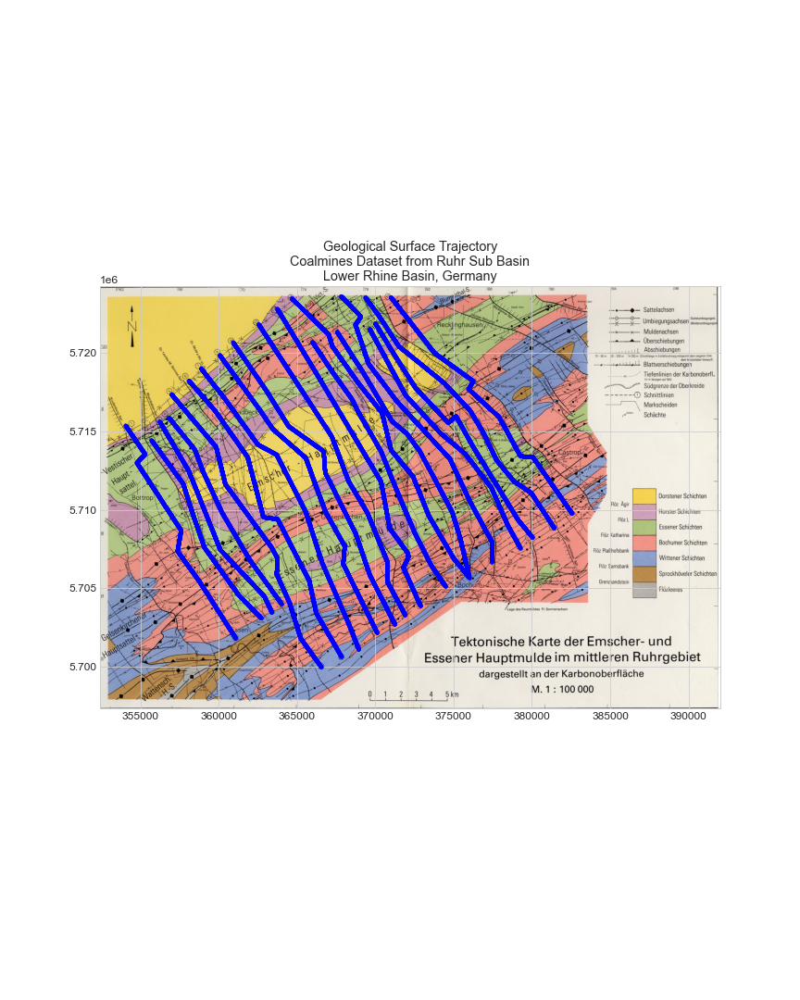

In [59]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-2\study-area-2-G4_Tafel_1_Map_4_Emscher_Middle_Ruhrbasin.tif")
file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-2\study-area-map-2-333-20-lines.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))

for section in sections_names:
    ax.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values, 
               zorder=1, alpha= 0.8, c='blue', s=10, label=section)
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal');

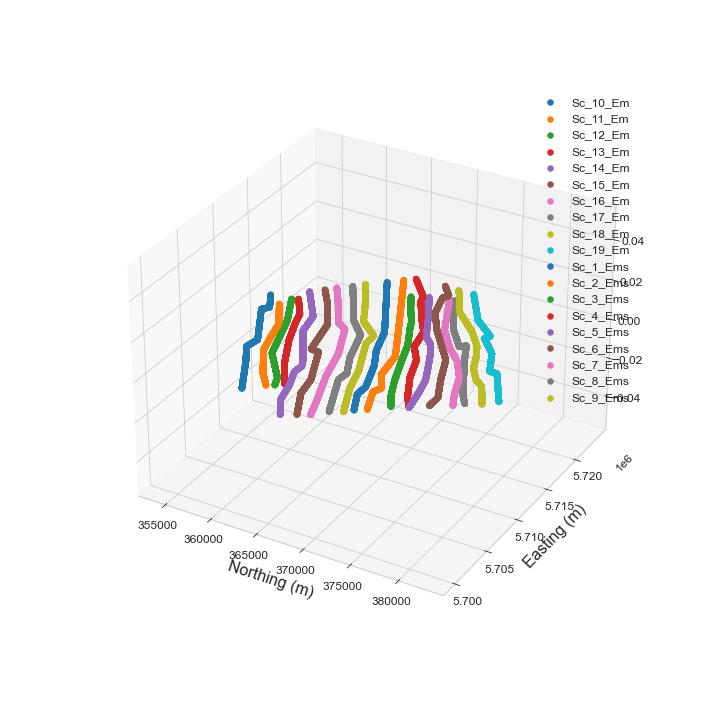

In [60]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax1 = plt.axes(projection='3d')

for section in sections_names:
    ax1.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values,
               path_data[section]['z'].values, 
               lw=2, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax1.legend();
# ax.view_init(60,60)

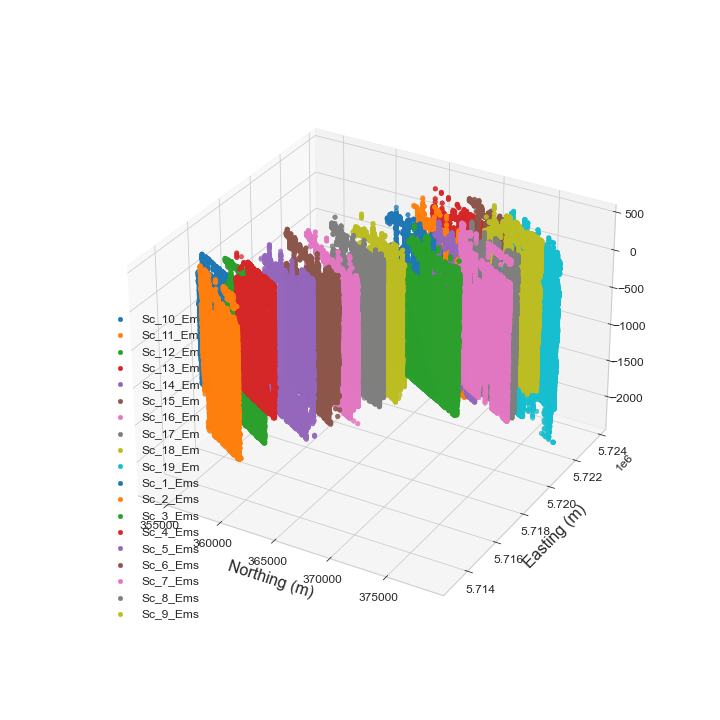

In [61]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [62]:
all_paths_points = pv.PolyData(all_paths[['y','x','z']].astype(float).values)
all_paths_points["Depth (m)"] = all_paths['z'].values

title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_paths_2 = pv.Plotter()
p_paths_2.add_mesh(all_paths_points, point_size=5, render_points_as_spheres=True)
actor = p_paths_2.add_title(title_paths, font='arial', color='k',
                     font_size=10)
p_paths_2.show_axes()
# _ = p_paths_2.show_grid()
p_paths_2.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [63]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-2" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_2 = pv.Plotter()
p_sections_2.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_2.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_2.show_axes()
# _ = p_sections_2.show_grid()
p_sections_2.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [64]:
folder_dir_area_2 = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-area-map-2\img-data'
plot_input_output(folder_dir_area_2)

<IPython.core.display.Javascript object>

Directory 'Digitised_images' can not be created


<IPython.core.display.Javascript object>

--------------------------------------------------------------------------------------------

# 3. Results - Bochumer Hauptmulde im ostl Ruhrgebiet - Area-3

![](https://i.imgur.com/kRO35Ug.png)

In [65]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-3\Final_Bochumer_Hauptmulde_im_ostl_Ruhrgebiet_G2'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[8:18])
        img_data[a[8:18]] = digitise_section(cv2.imread(image))
        sec_data[a[8:18]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-3\study-area-map-3-111-29-lines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].unique().tolist()
path_section_ls = df['Name'].unique().tolist()

In [66]:
dict_map = {
 
'Section_1' : 'Section_1_',
 'Section_2' : 'Section_2_',
 'Section_3' : 'Section_3_',
 'Section_4' : 'Section_4_',
 'Section_5' : 'Section_5_',
 'Section_6' : 'Section_6_',
 'Section_7' : 'Section_7_',
 'Section_8' : 'Section_8_',
 'Section_9' : 'Section_9_', 
'Section_10' : 'Section_10',
 'Section_11': 'Section_11',
 'Section_12' : 'Section_12',
 'Section_13' :'Section_13',
 'Section_14' : 'Section_14',
 'Section_15' : 'Section_15',
 'Section_16' : 'Section_16',
 'Section_17' : 'Section_17',
 'Section_18' : 'Section_18',
 'Section_19' : 'Section_19',
 'Section_20' : 'Section_20',
 'Section_21' : 'Section_21',
 'Section_22' : 'Section_22',
 'Section_23' : 'Section_23',
 'Section_24' : 'Section_24',
 'Section_25' : 'Section_25',
 'Section_26' : 'Section_26',
 'Section_27' : 'Section_27',
 'Section_28' : 'Section_28',
 'Section_29' : 'Section_29',
                                        }

In [67]:
df['Name'] = df['Name'].map(dict_map)

In [68]:
path_data = {}
for section in sections_names:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [69]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

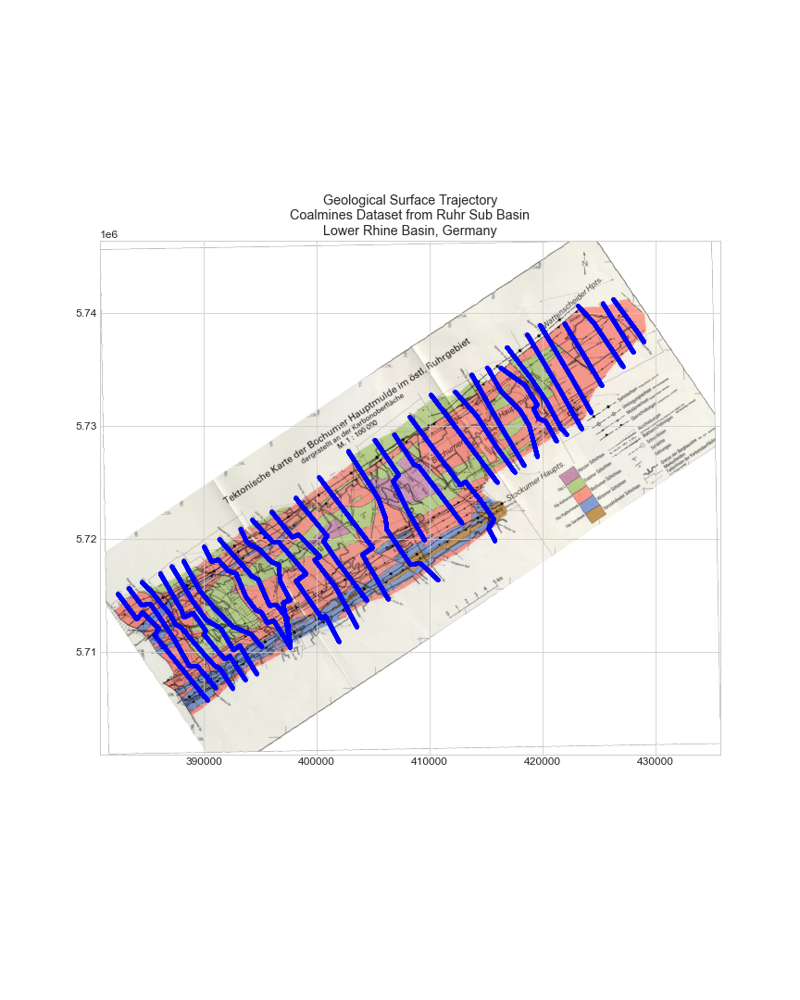

In [70]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-3\study-area-333-G2_Tafel_1_Map_1_Final_Bochumer_Hauptmulde_im_ostl_Ruhrgebiet.tif")
file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-3\study-area-map-3-222-BBOX.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))

for section in sections_names:
    ax.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values, 
               zorder=1, alpha= 0.8, c='blue', s=10, label=section)
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal');

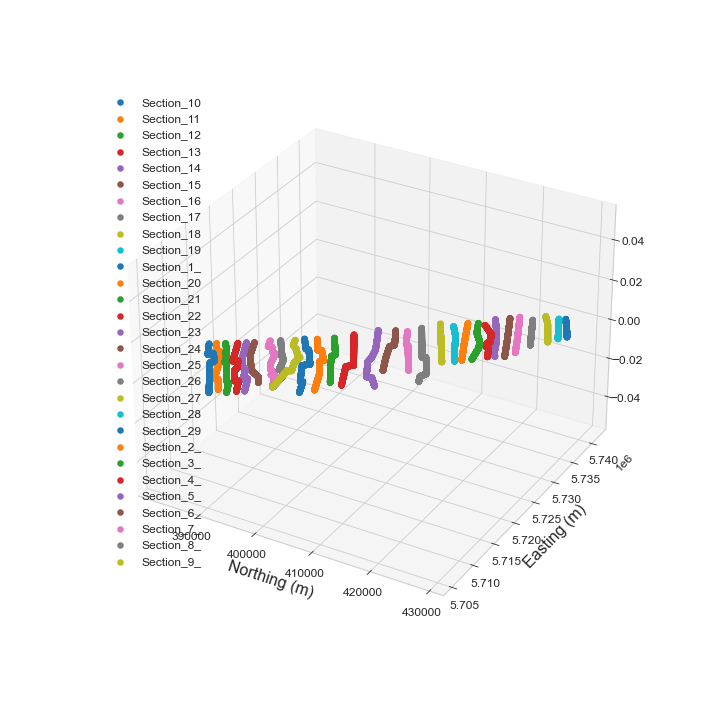

In [71]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax1 = plt.axes(projection='3d')

for section in sections_names:
    ax1.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values,
               path_data[section]['z'].values, 
               lw=2, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax1.legend();
# ax.view_init(60,60)

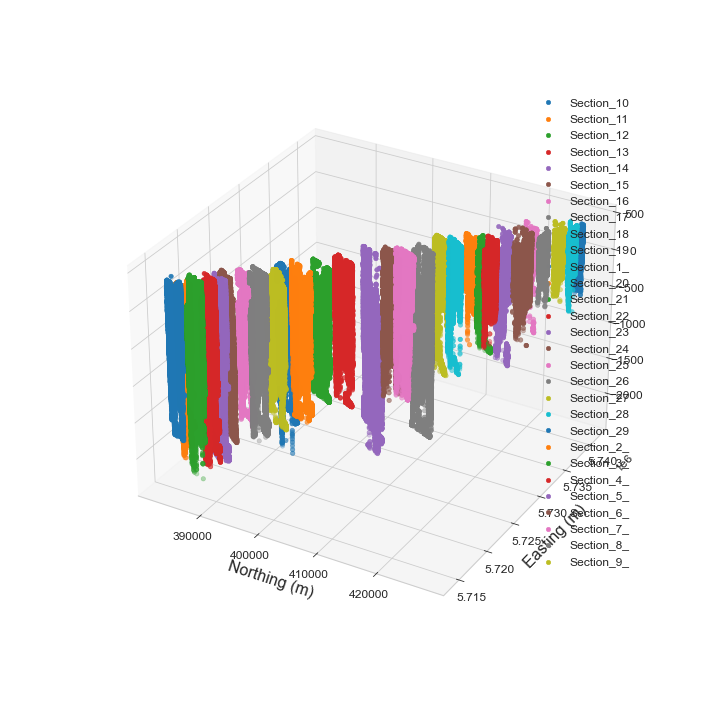

In [72]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [73]:
all_paths_points = pv.PolyData(all_paths[['y','x','z']].astype(float).values)
all_paths_points["Depth (m)"] = all_paths['z'].values

title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_paths_3 = pv.Plotter()
p_paths_3.add_mesh(all_paths_points, point_size=5, render_points_as_spheres=True)
actor = p_paths_3.add_title(title_paths, font='arial', color='k',
                     font_size=10)
p_paths_3.show_axes()
# _ = p_paths_3.show_grid()
p_paths_3.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [74]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-3" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_3 = pv.Plotter()
p_sections_3.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_3.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_3.show_axes()
# _ = p_sections_3.show_grid()
p_sections_3.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [75]:
folder_dir_area_3 = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-3\Final_Bochumer_Hauptmulde_im_ostl_Ruhrgebiet_G2'
plot_input_output(folder_dir_area_3)

<IPython.core.display.Javascript object>

Directory 'Digitised_images' can not be created


<IPython.core.display.Javascript object>

--------------------------------------------------------------------------------------------------

# 4. Results - Aachen Erkelenzer Steinkohlen - Area-4

![](https://i.imgur.com/1K3nRxP.jpg)

#### Plot the Maps of Study Area 4

Area three have for sub study areas we will plot each sections on its own map. Here we plot the three study area on one large map.

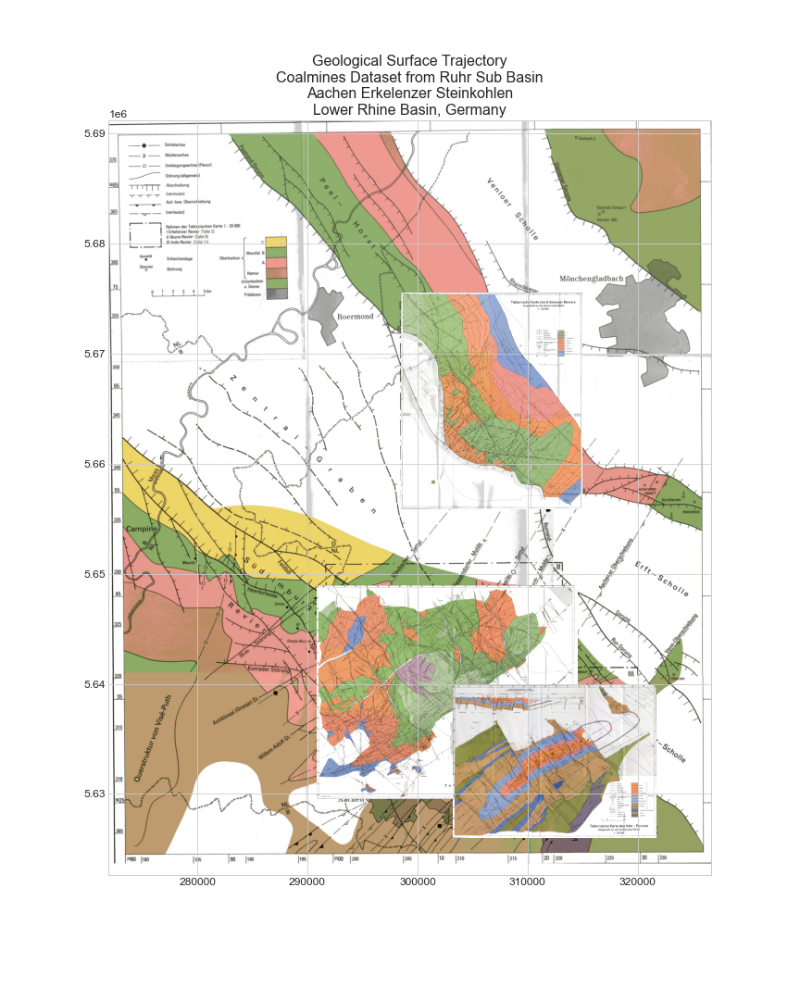

In [76]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\G3_All_Tafel1_Map_2_Final_Aachen_Erkelenzer_Steinkohlen.tif")
ruh_A = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\G3_2_Tafel6_Map_3_Final_Aachen_Erkelenzer_Steinkohlen.tif")
ruh_C = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\G3_4_Tafel11_Map_3_Final_Aachen_Erkelenzer_Steinkohlen.tif")
ruh_B = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\G3_1_Tafel2_Map_2_Final_Aachen_Erkelenzer_Steinkohlen_G3.tif")


file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\Large-Maps-1-BBoxs.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

file_bbox_A = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\111-Maps-1-BBoxs.dat"
bbox_df_A = pd.read_table(file_bbox_A, sep="\s+")
BBox_A = (bbox_df_A['x'].values.min(),bbox_df_A['x'].values.max(),
        bbox_df_A['y'].values.min(),bbox_df_A['y'].values.max(),)

file_bbox_C = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\222-Maps-1-BBoxs.dat"
bbox_df_C = pd.read_table(file_bbox_C, sep="\s+")
BBox_C = (bbox_df_C['x'].values.min(),bbox_df_C['x'].values.max(),
        bbox_df_C['y'].values.min(),bbox_df_C['y'].values.max(),)

file_bbox_B = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\333-Maps-1-BBoxs.dat"
bbox_df_B = pd.read_table(file_bbox_B, sep="\s+")
BBox_B = (bbox_df_B['x'].values.min(),bbox_df_B['x'].values.max(),
        bbox_df_B['y'].values.min(),bbox_df_B['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))


title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nAachen Erkelenzer Steinkohlen" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths, fontsize=16)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())

ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')
ax.imshow(ruh_A, zorder=0, extent = BBox_A, aspect= 'equal')
ax.imshow(ruh_B, zorder=0, extent = BBox_B, aspect= 'equal')
ax.imshow(ruh_C, zorder=0, extent = BBox_C, aspect= 'equal');

In [77]:
########################################################################

## Substudy Area (A)

In [78]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-1-A'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[7:17])
        img_data[a[7:17]] = digitise_section(cv2.imread(image))
        sec_data[a[7:17]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\study-area-A\all-111-222-Maps-1-inlines-xlines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].unique().tolist()
path_section_ls = df['Name'].unique().tolist()

In [79]:
folder_dir_area_4_A = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-1-A'
plot_input_output(folder_dir_area_4_A)

<IPython.core.display.Javascript object>

Directory 'Digitised_images' can not be created


<IPython.core.display.Javascript object>

In [80]:
dict_map = {
 
'Section_1_' : 'Section_1_',
 'Section_2_' : 'Section_2_',
 'Section_3_' : 'Section_3_',
 'Section_4_' : 'Section_4_',
 'Section_5_' : 'Section_5_',
 'Section_6_' : 'Section_6_',
 'Section_7_' : 'Section_7_',
 'Section_8_' : 'Section_8_',
 'Section_9_' : 'Section_9_',
 'Section_10_94' : 'Section_10',
 'Section_11_95' : 'Section_11',
 'Section_12_96' : 'Section_12',
 'Section_13_97' : 'Section_13',
 'Section_14_98' : 'Section_14',
 'Section_15_99' : 'Section_15',
 'Section_16_100' : 'Section_16',
 'Section_17_101' : 'Section_17',
 'Section_18_102' : 'Section_18',
 'Section_19_103' : 'Section_19',
    
 'Section_C_' : 'Section_C_' ,
 'Section_A_' : 'Section_A_' ,
 'Section_D_' : 'Section_D_' ,
 'Section_H_' : 'Section_H_' ,
 'Section_I_' : 'Section_I_' ,
 'Section_B_' : 'Section_B_',
 'Section_E_' : 'Section_E_',
 'Section_F_' : 'Section_F_',
 'Section_G_' : 'Section_G_',
                            }

In [81]:
df['Name'] = df['Name'].map(dict_map)

In [82]:
path_data = {}
for section in sections_names:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [83]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

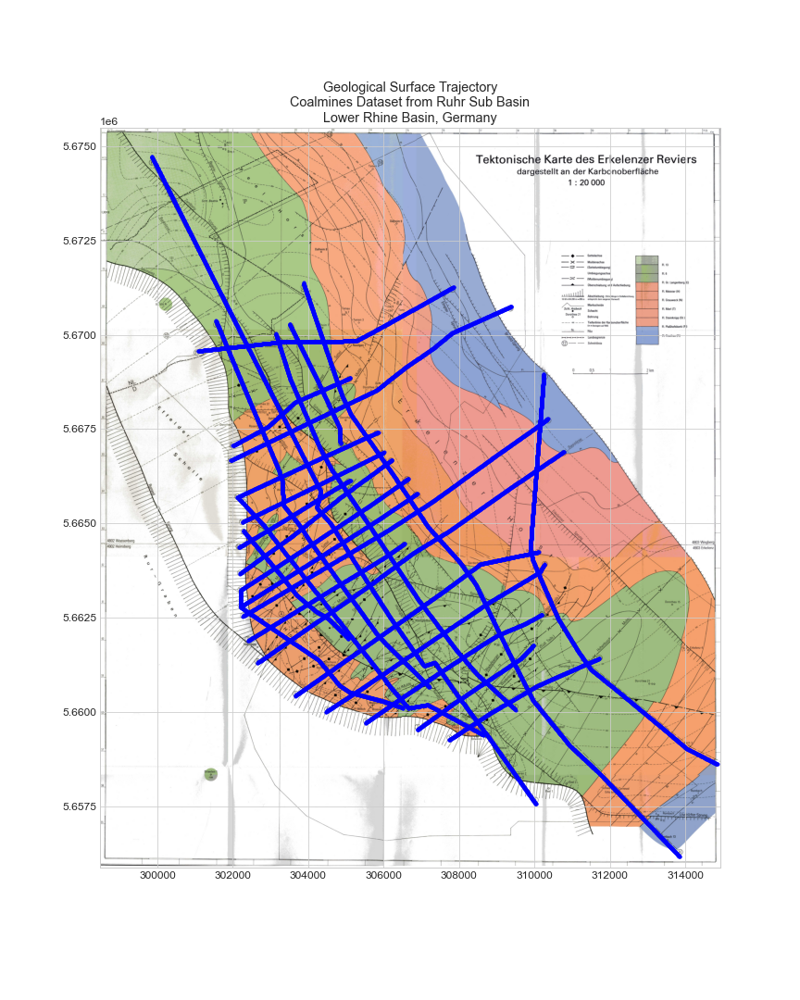

In [84]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\G3_1_Tafel2_Map_2_Final_Aachen_Erkelenzer_Steinkohlen_G3.tif")
file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\333-Maps-1-BBoxs.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))

for section in sections_names:
    ax.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values, 
               zorder=1, alpha= 0.8, c='blue', s=10, label=section)
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal');

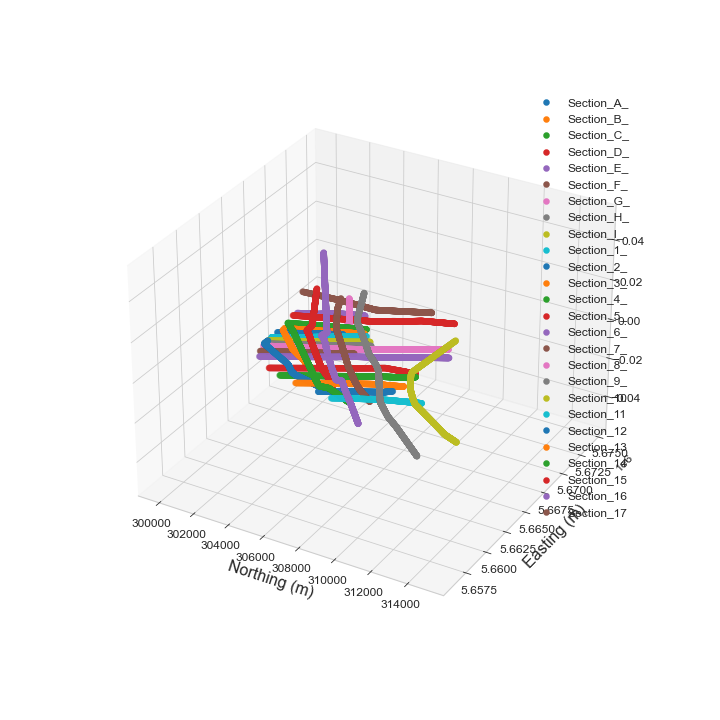

In [85]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax1 = plt.axes(projection='3d')

for section in sections_names:
    ax1.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values,
               path_data[section]['z'].values, 
               lw=2, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax1.legend();
# ax.view_init(60,60)

In [86]:
all_paths_points = pv.PolyData(all_paths[['y','x','z']].astype(float).values)
all_paths_points["Depth (m)"] = all_paths['z'].values

title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_paths_4A = pv.Plotter()
p_paths_4A.add_mesh(all_paths_points, point_size=5, render_points_as_spheres=True)
actor = p_paths_4A.add_title(title_paths, font='arial', color='k',
                     font_size=10)
p_paths_4A.show_axes()
# _ = p_paths_4A.show_grid()
p_paths_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Inline Sections

First, let us digitize the inline sections. 

In [87]:
sections_names_inlines_ls = ['Section_1_',
                             'Section_2_',
                             'Section_3_',
                             'Section_4_',
                             'Section_5_',
                             'Section_6_',
                             'Section_7_',
                             'Section_8_',
                             'Section_9_',
                             'Section_10',
                             'Section_11',
                             'Section_12',
                             'Section_13',
                             'Section_14',
                             'Section_15',
                             'Section_16',
                             'Section_17']

In [88]:
img_data = {key: img_data.get(key) for key in sections_names_inlines_ls}

In [89]:
path_data = {}
for section in sections_names_inlines_ls:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [90]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names_inlines_ls: 
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

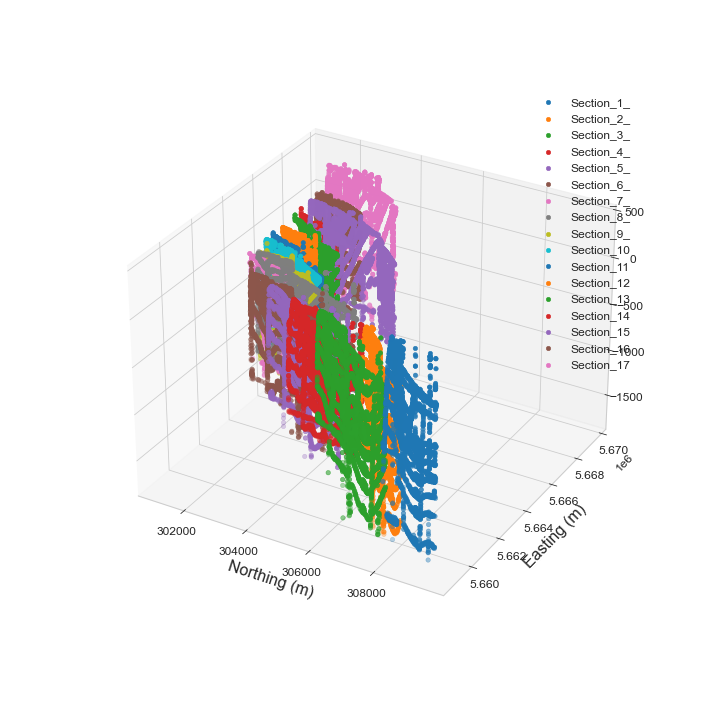

In [91]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names_inlines_ls:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [92]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-4" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_4A = pv.Plotter()
p_sections_4A.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_4A.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_4A.show_axes()
# _ = p_sections_4A.show_grid()
p_sections_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Cross Sections

In [93]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-1-A'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[7:17])
        img_data[a[7:17]] = digitise_section(cv2.imread(image))
        sec_data[a[7:17]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\study-area-A\all-111-222-Maps-1-inlines-xlines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].unique().tolist()
path_section_ls = df['Name'].unique().tolist()

In [94]:
sections_names_crosslines_ls = sections_names[0:9]

In [95]:
img_data = {key: img_data.get(key) for key in sections_names_crosslines_ls}

path_data = {}
for section in sections_names_crosslines_ls:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)


In [96]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names_crosslines_ls:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

In [97]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names_crosslines_ls: 
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

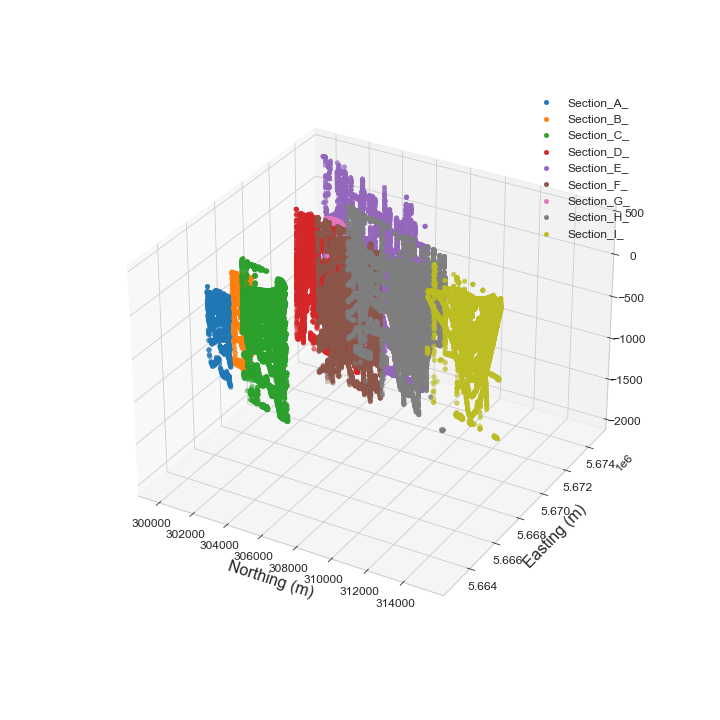

In [98]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names_crosslines_ls:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [99]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-4 (A)" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_4A = pv.Plotter()
p_sections_4A.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_4A.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_4A.show_axes()
# _ = p_sections_4A.show_grid()
p_sections_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [100]:
#################################################

## Substudy Area (B)

In [101]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-2-B'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[7:17])
        img_data[a[7:17]] = digitise_section(cv2.imread(image))
        sec_data[a[7:17]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\study-area-B\all-111-Maps-2-cross-lines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].unique().tolist()
path_section_ls = df['Name'].unique().tolist()

In [102]:
folder_dir_area_4_B = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-2-B'
plot_input_output(folder_dir_area_4_B)

<IPython.core.display.Javascript object>

Directory 'Digitised_images' can not be created


<IPython.core.display.Javascript object>

In [103]:
dict_map = {

 'Section_1__113' : 'Section_1_',
 'Section_2__114' : 'Section_2_',
 'Section_3__115' : 'Section_3_',
 'Section_4__116' : 'Section_4_',
 'Section_5__117' : 'Section_5_', 
 'Section_6__118' : 'Section_6_',
 'Section_7__119' : 'Section_7_',
 'Section_8__120' : 'Section_8_',
 'Section_9__121' : 'Section_9_',   
 'Section_10_122' : 'Section_10',
 'Section_11_123' : 'Section_11',
 'Section_12_124' : 'Section_12',
 'Section_13_125' : 'Section_13',
 'Section_14_126' : 'Section_14',
 'Section_15_127' : 'Section_15',
 'Section_16_128' : 'Section_16',
 'Section_17_129' : 'Section_17',
 'Section_18_130' : 'Section_18',

 'Section_A__131' : '_Section_A',
 'Section_A_2_'   : '_Section_a',
 'Section_B__133' : '_Section_B',
 'Section_C__134' : '_Section_C',
 'Section_D__135' : '_Section_D',
 'Section_E__136' : '_Section_E',
 'Section_G__138' : '_Section_G',
 'Section_F__137' : '_Section_F',
 'Section_H__139' : '_Section_H',

                            }

In [104]:
df['Name'] = df['Name'].map(dict_map)

In [105]:
path_data = {}
for section in sections_names:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [106]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

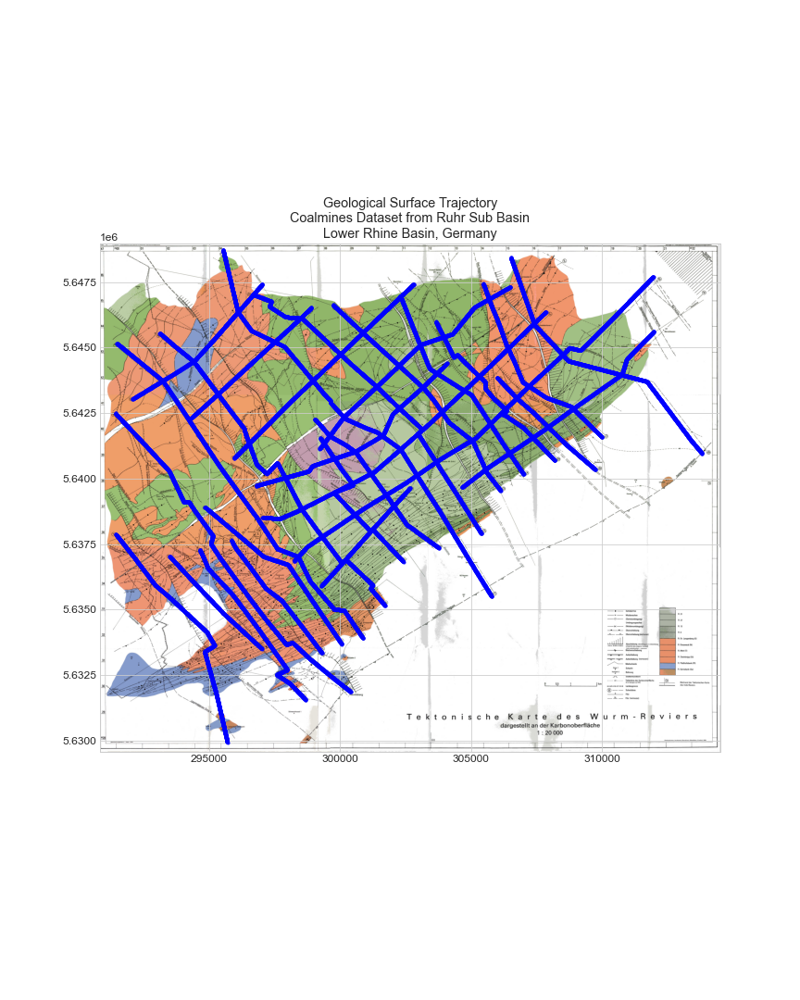

In [107]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-2-B\Tafel6_Map_3_Final_Aachen_Erkelenzer_Steinkohlen_G3.jpg")
file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\111-Maps-1-BBoxs.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))

for section in sections_names:
    ax.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values, 
               zorder=1, alpha= 0.8, c='blue', s=10, label=section)
    
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal');

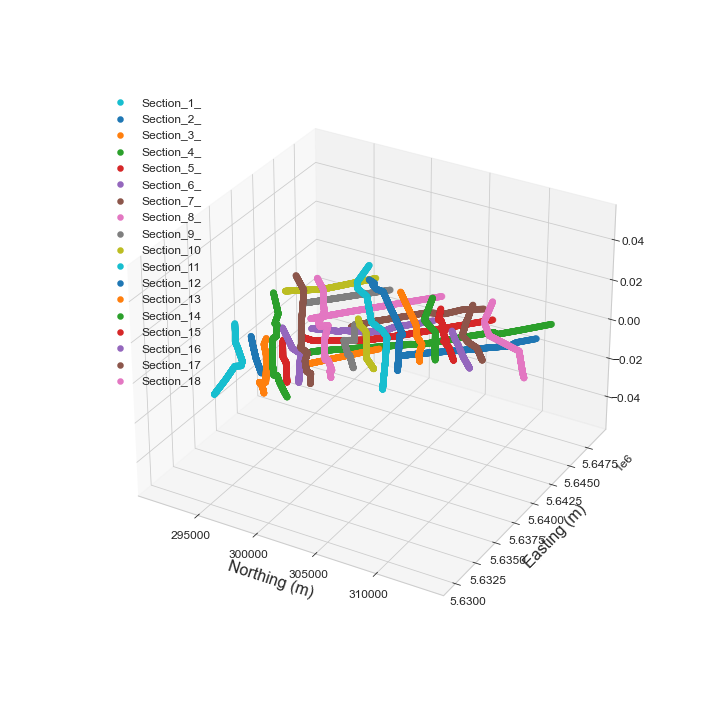

In [108]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax1 = plt.axes(projection='3d')

for section in sections_names:
    ax1.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values,
               path_data[section]['z'].values, 
               lw=2, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax1.legend();
# ax.view_init(60,60)

In [109]:
all_paths_points = pv.PolyData(all_paths[['y','x','z']].astype(float).values)
all_paths_points["Depth (m)"] = all_paths['z'].values

title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_paths_4A = pv.Plotter()
p_paths_4A.add_mesh(all_paths_points, point_size=5, render_points_as_spheres=True)
actor = p_paths_4A.add_title(title_paths, font='arial', color='k',
                     font_size=10)
p_paths_4A.show_axes()
# _ = p_paths_4A.show_grid()
p_paths_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Inline Sections

In [110]:
sections_names_inlines_ls = ['Section_1_',
                             'Section_2_',
                             'Section_3_',
                             'Section_4_',
                             'Section_5_',
                             'Section_6_',
                             'Section_7_',
                             'Section_8_',
                             'Section_9_',
                             'Section_10',
                             'Section_11',
                             'Section_12',
                             'Section_13',
                             'Section_14',
                             'Section_15',
                             'Section_16',
                             'Section_17',
                             'Section_18',
                                            ]

In [111]:
img_data = {key: img_data.get(key) for key in sections_names_inlines_ls}

path_data = {}
for section in sections_names_inlines_ls:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)
    
    
all_sections_ls = []
all_paths_ls = []
for section in sections_names_inlines_ls: 
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

C:\Users\r04ra18\Anaconda3\envs\ML_comp\lib\site-packages\ipympl\backend_nbagg.py:336: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self.figure.savefig(buf, format='png', dpi='figure')


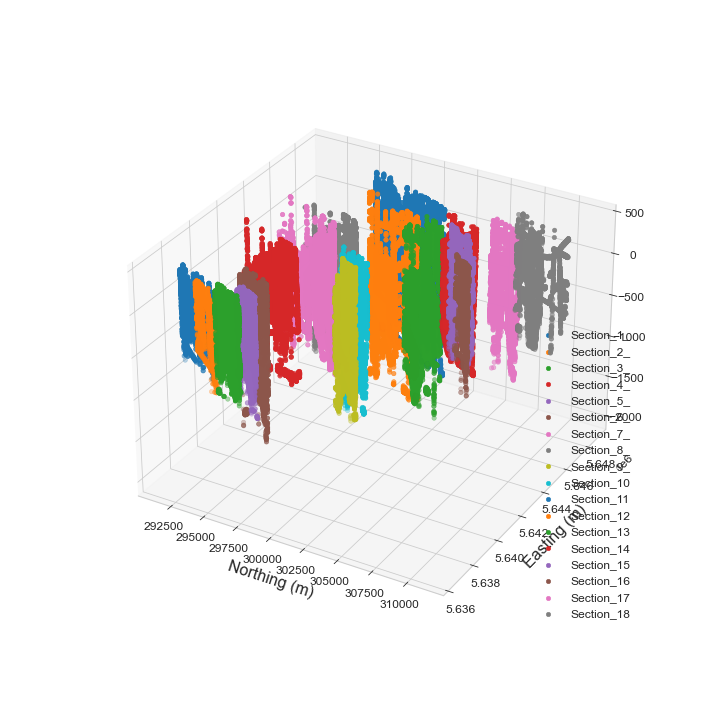

In [112]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names_inlines_ls:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [113]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-4 (B)" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_4A = pv.Plotter()
p_sections_4A.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_4A.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_4A.show_axes()
# _ = p_sections_4A.show_grid()
p_sections_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Cross Sections

In [114]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-2-B'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[7:17])
        img_data[a[7:17]] = digitise_section(cv2.imread(image))
        sec_data[a[7:17]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\study-area-B\all-111-Maps-2-cross-lines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].unique().tolist()
path_section_ls = df['Name'].unique().tolist()

In [115]:
dict_map = {

 'Section_1__113' : 'Section_1_',
 'Section_2__114' : 'Section_2_',
 'Section_3__115' : 'Section_3_',
 'Section_4__116' : 'Section_4_',
 'Section_5__117' : 'Section_5_', 
 'Section_6__118' : 'Section_6_',
 'Section_7__119' : 'Section_7_',
 'Section_8__120' : 'Section_8_',
 'Section_9__121' : 'Section_9_',   
 'Section_10_122' : 'Section_10',
 'Section_11_123' : 'Section_11',
 'Section_12_124' : 'Section_12',
 'Section_13_125' : 'Section_13',
 'Section_14_126' : 'Section_14',
 'Section_15_127' : 'Section_15',
 'Section_16_128' : 'Section_16',
 'Section_17_129' : 'Section_17',
 'Section_18_130' : 'Section_18',

 'Section_A__131' : '_Section_A',
 'Section_A_2_'   : '_Section_a',
 'Section_B__133' : '_Section_B',
 'Section_C__134' : '_Section_C',
 'Section_D__135' : '_Section_D',
 'Section_E__136' : '_Section_E',
 'Section_G__138' : '_Section_G',
 'Section_F__137' : '_Section_F',
 'Section_H__139' : '_Section_H',

                            }

In [116]:
df['Name'] = df['Name'].map(dict_map)

In [117]:
sections_names_crosslines_ls = sections_names[0:9]

In [118]:
img_data = {key: img_data.get(key) for key in sections_names_crosslines_ls}

In [119]:
path_data = {}
for section in sections_names_crosslines_ls:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [120]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names_crosslines_ls:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

In [121]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names_crosslines_ls: 
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

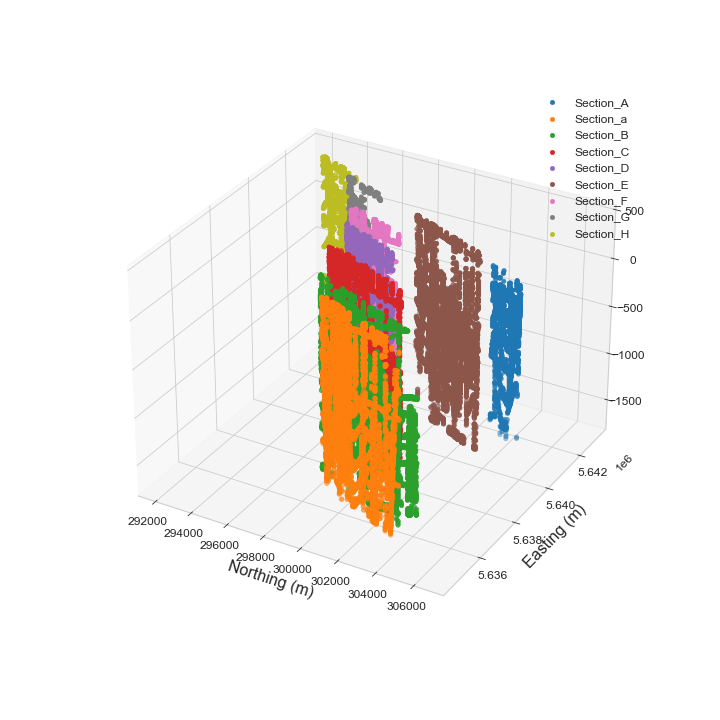

In [122]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names_crosslines_ls:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section[1:])

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [123]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-4 (A)" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_4A = pv.Plotter()
p_sections_4A.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_4A.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_4A.show_axes()
# _ = p_sections_4A.show_grid()
p_sections_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [124]:
####################################

## Substudy Area (C)

In [125]:
folder_dir = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-3-C'

img_data = {}
sec_data = {}
sections_names = []
for image in glob.iglob(f'{folder_dir}/*'):
    if (image.endswith(".png")):
        a = image.split("\\")[-1]
        a = a.split(".")[0]
        sections_names.append(a[8:18])
        img_data[a[8:18]] = digitise_section(cv2.imread(image))
        sec_data[a[8:18]] = digitise_data_section(cv2.imread(image))
        
file_path = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\study-area-C\in-111-Maps-3-inlines.dat"

df = pd.read_table(file_path, sep="\s+")
path_name_ls = df['Name'].tolist()
path_section_ls = df['Name'].unique().tolist()

path_name_ls_clean = [path_name_ls[i][:-4] for i in range(len(path_name_ls))]
df['Name'] = path_name_ls_clean

In [126]:
folder_dir_area_4_C = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-3-C'
plot_input_output(folder_dir_area_4_C)

<IPython.core.display.Javascript object>

Directory 'Digitised_images' can not be created


<IPython.core.display.Javascript object>

In [127]:
path_data = {}
for section in sections_names:
    path_data[section] = df[df['Name'] == section][['z', 'x', 'y']]
    path_data[section].reset_index(inplace=True, drop=True)

In [128]:
all_sections_ls = []
all_paths_ls = []
for section in sections_names:
    img_data[section]['x'] = img_data[section]['x'].values + path_data[section]['x'].values[0]
    img_data[section]['y'] = img_data[section]['y'].values + path_data[section]['y'].values[0] 
    path_data[section]['z'] = path_data[section]['z'].values*0
    
    all_sections_ls.append(img_data[section])
    all_paths_ls.append(path_data[section])
    
all_sections = pd.concat(all_sections_ls)
all_sections.reset_index(inplace=True, drop=True)

all_paths = pd.concat(all_paths_ls)
all_paths.reset_index(inplace=True, drop=True)

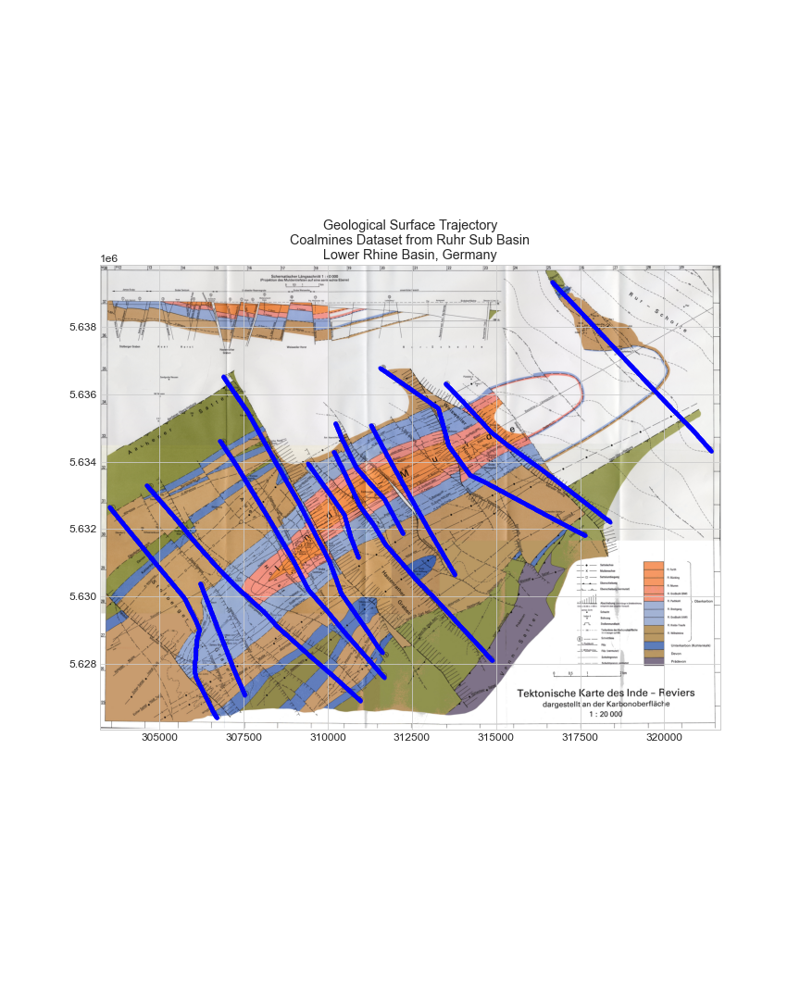

In [129]:
ruh_m = plt.imread(r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\G3_4_Tafel11_Map_3_Final_Aachen_Erkelenzer_Steinkohlen.tif")
file_bbox = r"C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Maps\222-Maps-1-BBoxs.dat"
bbox_df = pd.read_table(file_bbox, sep="\s+")
BBox = (bbox_df['x'].values.min(),bbox_df['x'].values.max(),
        bbox_df['y'].values.min(),bbox_df['y'].values.max(),)

fig, ax = plt.subplots(figsize = (12,15))

for section in sections_names:
    ax.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values, 
               zorder=1, alpha= 0.8, c='blue', s=10, label=section)
    
title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

ax.set_title(title_paths)
ax.set_xlim(bbox_df['x'].values.min(),bbox_df['x'].values.max())
ax.set_ylim(bbox_df['y'].values.min(),bbox_df['y'].values.max())
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal');

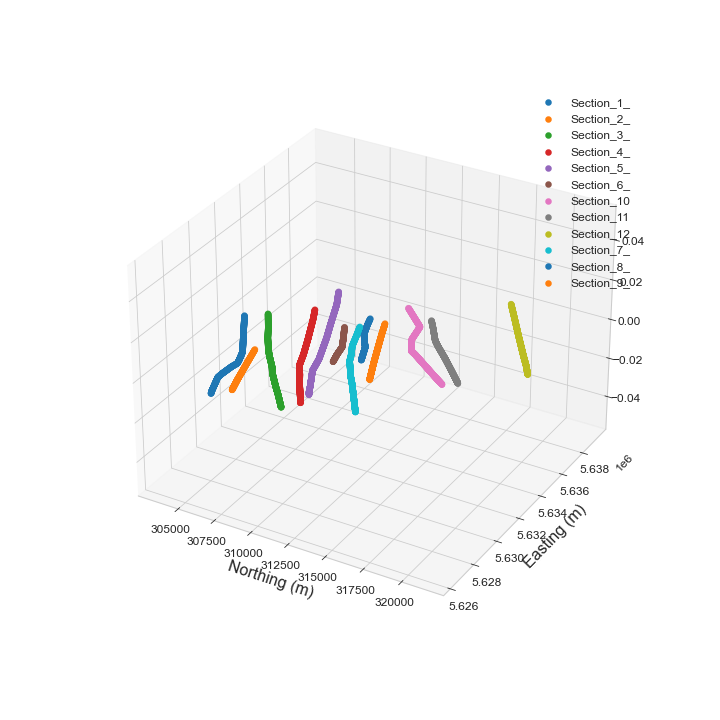

In [130]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax1 = plt.axes(projection='3d')

for section in sections_names:
    ax1.scatter(path_data[section]['x'].values, 
               path_data[section]['y'].values,
               path_data[section]['z'].values, 
               lw=2, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax1.legend();
# ax.view_init(60,60)

In [131]:
all_paths_points = pv.PolyData(all_paths[['y','x','z']].astype(float).values)
all_paths_points["Depth (m)"] = all_paths['z'].values

title_paths = "Geological Surface Trajectory" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_paths_4A = pv.Plotter()
p_paths_4A.add_mesh(all_paths_points, point_size=5, render_points_as_spheres=True)
actor = p_paths_4A.add_title(title_paths, font='arial', color='k',
                     font_size=10)
p_paths_4A.show_axes()
# _ = p_paths_4A.show_grid()
p_paths_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

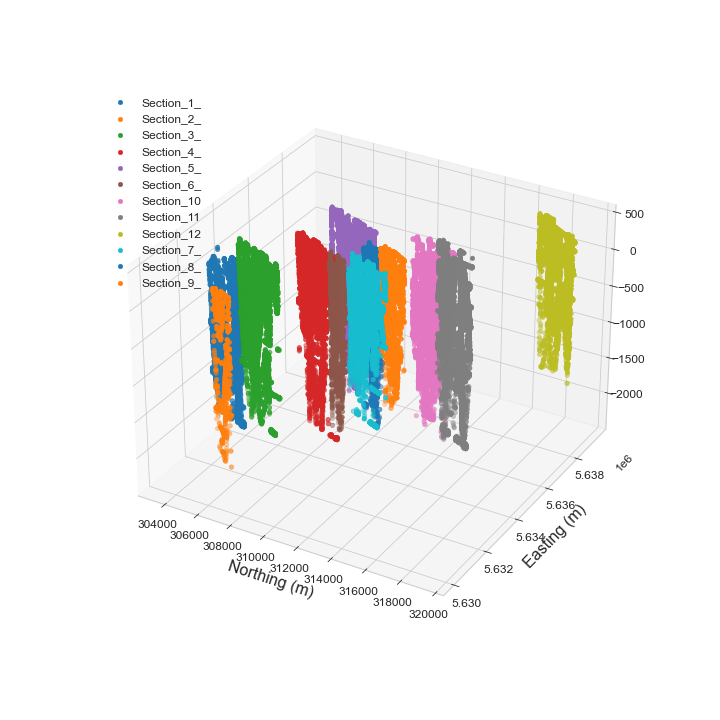

In [132]:
%matplotlib inline
%matplotlib widget

plt.rcParams["figure.figsize"] = (10,10)
fig = plt.figure()
ax = plt.axes(projection='3d')

for section in sections_names:
    ax.scatter(img_data[section]['x'].values, 
               img_data[section]['y'].values,
               img_data[section]['z'].values, 
               lw=0.5, label=section)

plt.xlabel('Northing (m)', fontsize=16)
plt.ylabel('Easting (m)', fontsize=16)
ax.legend();
# ax.view_init(60,60)

In [133]:
all_sections_points = pv.PolyData(all_sections[['y','x','z']].astype(float).values)
all_sections_points["Depth (m)"] = all_sections['z'].values

title_sections = "Digitised Geological Sections of Study Area-4 (B)" + "\nCoalmines Dataset from Ruhr Sub Basin" + "\nLower Rhine Basin, Germany" 

p_sections_4A = pv.Plotter()
p_sections_4A.add_mesh(all_sections_points, point_size=3, render_points_as_spheres=True)
actor = p_sections_4A.add_title(title_sections, font='arial', color='k',
                     font_size=10)
p_sections_4A.show_axes()
# _ = p_sections_4A.show_grid()
p_sections_4A.show()

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

# Example Sections

Now let us use our function to plot images sections and its digitise data.

In [134]:
folder_dir_1 = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Digitization-tool-data'
folder_dir_2 = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-2\img-data'
folder_dir_3 = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-3\Final_Bochumer_Hauptmulde_im_ostl_Ruhrgebiet_G2'
folder_dir_4_A = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-1-A'
folder_dir_4_B = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-2-B'
folder_dir_4_C = r'C:\Users\r04ra18\Desktop\3D-Maps-ML-surfaces\Study-Area-4\Final_Aachen_Erkelenzer_Steinkohlen_G3\studay-area-4-3-C'

In [135]:
# plot_input_output(folder_dir_1)
# plot_input_output(folder_dir_2)
# plot_input_output(folder_dir_3)
# plot_input_output(folder_dir_4_A)
# plot_input_output(folder_dir_4_B)
# plot_input_output(folder_dir_4_C)

## Study Area-1

![](https://i.imgur.com/KxccI6k.png)

## Study Area-2

![](https://i.imgur.com/QLZfusK.png)

## Study Area-3

![](https://i.imgur.com/S6gMv8k.png)

## Study Area-4

### Substudy Area-4-A

![](https://i.imgur.com/fKBdwgD.png)

### Substudy Area-4-B

![](https://i.imgur.com/H1EMC4t.png)

### Substudy Area-4-C

![](https://i.imgur.com/kS8eKol.png)

**Thank you!**

**By: Ramy Abdallah**